# SVM Further Exploration

After the previous analysis, we have developed an interest in SVM. We will now explore the SVM algorithm in more depth and apply it to a different dataset.

Support Vector Machine (SVM) is a powerful machine learning algorithm used for binary classification tasks. It aims to find the optimal hyperplane that best separates data points of different classes in a high-dimensional feature space. The key idea of SVM is to identify the 'support vectors', which are the data points closest to the decision boundary or hyperplane. These support vectors play a critical role in determining the position and orientation of the hyperplane, making SVM a robust and effective method for solving binary classification problems.

## Cross Validation

Cross-validation is a technique used in machine learning to evaluate the performance of a model. It involves dividing the dataset into multiple folds, training the model on a subset of the folds, and evaluating it on the remaining fold. This process is repeated multiple times to obtain a reliable estimate of the model's performance. Cross-validation is commonly used for model evaluation, selection, and performance estimation.

In this further exploration, we utilize cross-validation for analysis.

## Importing Libraries and Data

In [84]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC

## cross validation
from sklearn.model_selection import cross_val_score

In [85]:
X = pd.read_csv('data/cleaned/X.csv')
y = pd.read_csv('data/cleaned/y.csv')

## Exploring the Data with 2 Features

To gain a preliminary understanding of SVM, we choose to analyze two parameters, which allows for better visualization and intuitive comprehension.

In [86]:
X_important = X[["meanfun", "IQR"]]

### Use 2 Features

This function takes in a support vector machine (svm) classifier, a feature matrix X, a target vector y, and a plot title. It then generates a plot of the decision boundary for the SVM based on the "meanfun" and "IQR" features in the X matrix, as well as a scatter plot of the data points colored by their target value. 

First, it sets the plot size to be 20x20 units. It then generates a 100x100 grid of values for "meanfun" and "IQR" using np.linspace, and creates a matrix of all possible combinations of these values using np.meshgrid. It then applies the SVM decision function to each point on this grid, which generates a matrix of predicted target values. The plot function then draws the decision boundary at values of -1, 0, and 1, and colors the regions between them with different line styles.

Finally, it generates a scatter plot of the data points in X, using only the "meanfun" and "IQR" columns, and colors each point based on its corresponding target value in y. It then sets the x- and y-axis labels, and the plot title, before displaying the plot using plt.show().

In [87]:
def draw_svm_plot(svm, X, y, title):
    plt.figure(figsize=(20, 20))
    x_plot = np.linspace(X["meanfun"].min(), X["meanfun"].max(), 100)
    y_plot = np.linspace(X["IQR"].min(), X["IQR"].max(), 100)
    X_plot, Y_plot = np.meshgrid(x_plot, y_plot)
    xy = np.vstack([X_plot.ravel(), Y_plot.ravel()]).T
    Z = svm.decision_function(xy).reshape(X_plot.shape)
    plt.contour(X_plot, Y_plot, Z, colors="k", levels=[-1, 0, 1], alpha=0.5, linestyles=["--", "-", "--"], linewidths=3)
    sns.scatterplot(data=X_important, x="meanfun", y="IQR", hue=y.squeeze())
    plt.xlabel("meanfun")
    plt.ylabel("IQR")
    plt.title(title)
    plt.show()

#### Linear Kernel

The linear kernel is the simplest kernel. The formula for the linear kernel is:
$$
K(x, x') = x^T x'
$$

In this code, a support vector machine (SVM) model with a linear kernel is trained using the feature matrix X_important and target vector y. The code then performs 5-fold cross-validation to evaluate the model's accuracy. The average accuracy across all folds is then printed to the console.

Finally, the function draw_svm_plot() is called to plot the decision boundary of the trained SVM model along with the data points in X_important, colored by their corresponding target values in y. The plot is titled "Linear Kernel".

Accuracy: 0.9661


C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


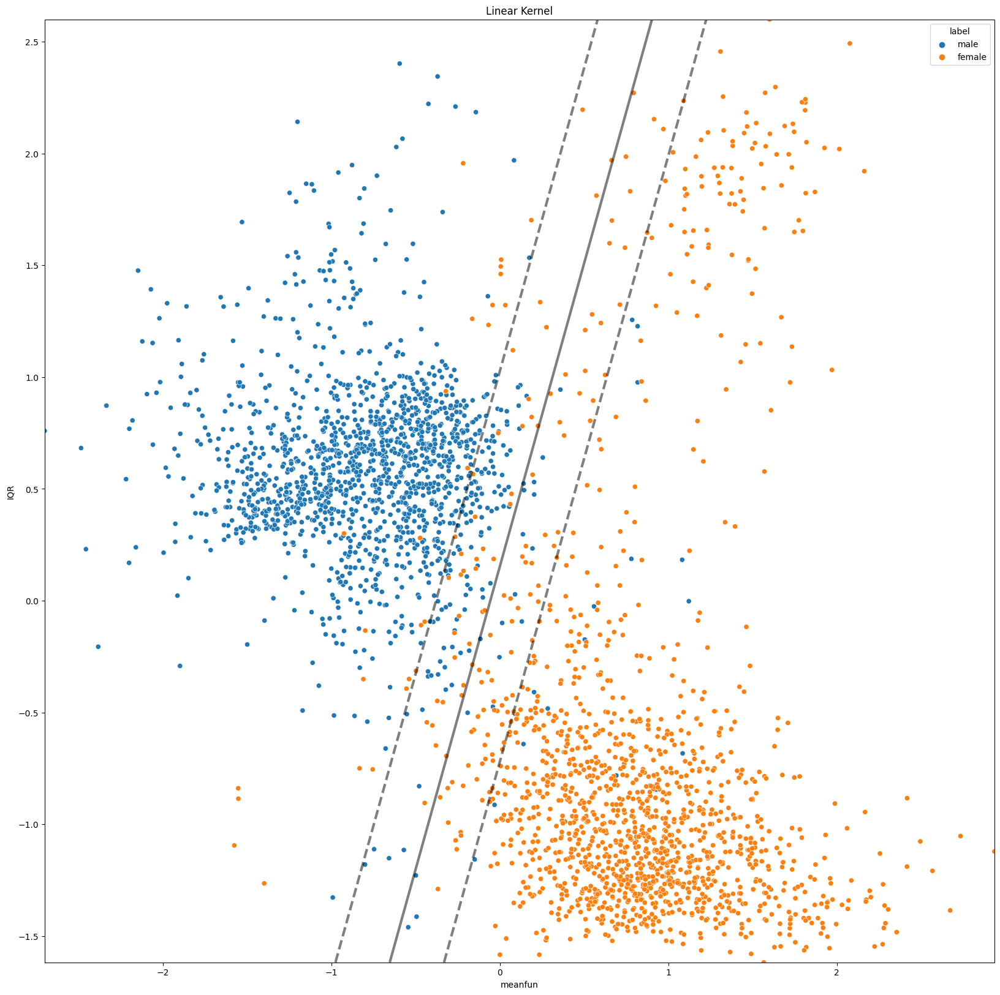

In [88]:
from sklearn.svm import SVC

svm_linear = SVC(random_state=87, kernel="linear").fit(X_important, y.squeeze()) # Create SVM model object
scores = cross_val_score(svm_linear, X_important, y.squeeze(), cv=5)  # Perform 5-fold cross-validation
svm_linear_accuracy = scores.mean()  # Get the average accuracy across all folds

print("Accuracy: {:.4f}".format(svm_linear_accuracy))

draw_svm_plot(svm_linear, X_important, y, "Linear Kernel")

#### Polynomial Kernel

The polynomial kernel is a more complex kernel. The formula for the polynomial kernel is:
$$
K(x, x') = (x^T x' + 1)^d
$$

Let's try to use the polynomial kernel with degree 3.

It uses the feature matrix X_important and target vector y. The code then performs 5-fold cross-validation to evaluate the model's accuracy. The average accuracy across all folds is then printed to the console.

Finally, the function draw_svm_plot() is called to plot the decision boundary of the trained SVM model along with the data points in X_important, colored by their corresponding target values in y. The plot is titled "Polynomial Kernel (Degree 3)".

Accuracy: 0.9458


C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


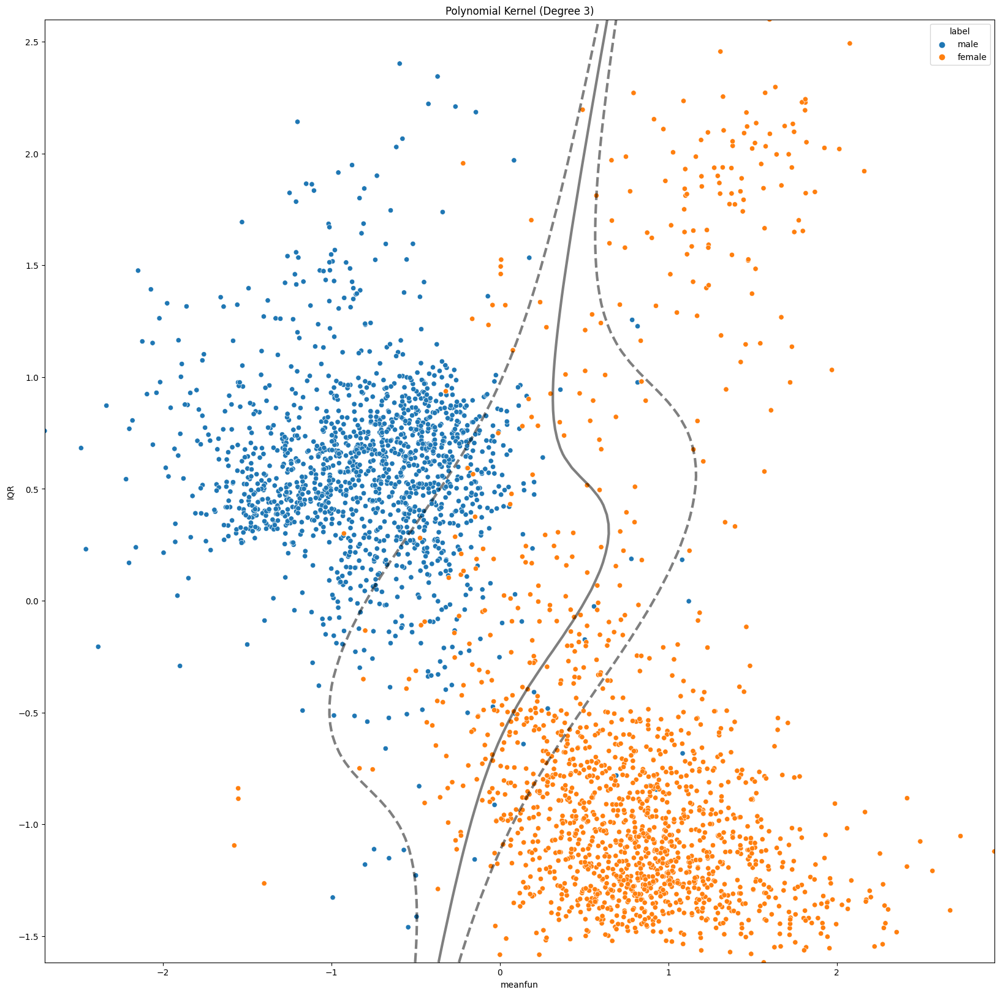

In [89]:
svm_poly = SVC(random_state=87, kernel="poly", degree=3).fit(X_important, y.squeeze())

scores = cross_val_score(svm_poly, X_important, y.squeeze(), cv=5)
svm_poly_accuracy = scores.mean()

print("Accuracy: {:.4f}".format(svm_poly_accuracy))

draw_svm_plot(svm_poly, X_important, y, "Polynomial Kernel (Degree 3)")

#### Gaussian Kernel

The Gaussian kernel is a more complex kernel. The formula for the Gaussian kernel is:
$$
K(x, x') = \exp(-\gamma ||x - x'||^2)
$$

This code trains a support vector machine (SVM) model with a Gaussian (RBF) kernel, using the feature matrix X_important and target vector y. The code then performs 5-fold cross-validation to evaluate the model's accuracy. The average accuracy across all folds is then printed to the console.

Finally, the function draw_svm_plot() is called to plot the decision boundary of the trained SVM model along with the data points in X_important, colored by their corresponding target values in y. The plot is titled "Gaussian Kernel".

Accuracy: 0.9684


C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


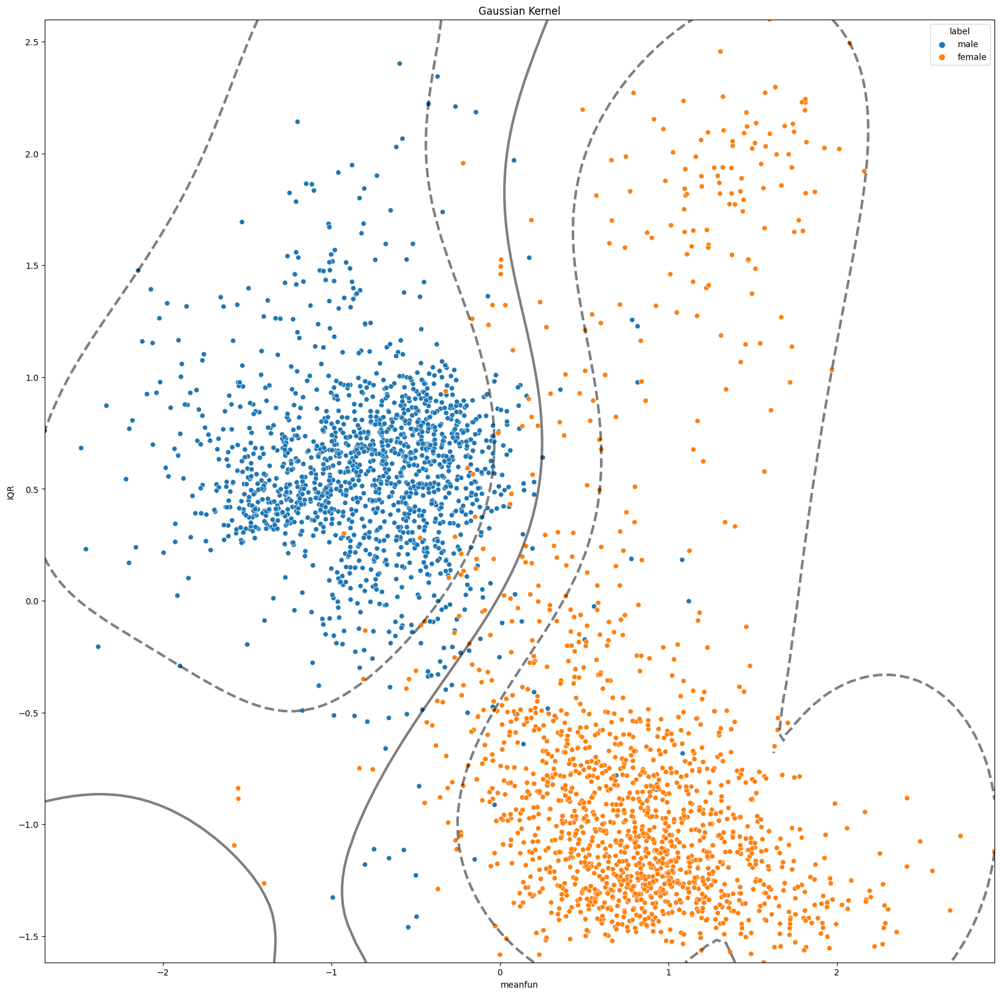

In [90]:
svm_gaussian = SVC(random_state=87, kernel="rbf").fit(X_important, y.squeeze())

scores = cross_val_score(svm_gaussian, X_important, y.squeeze(), cv=5)
svm_gaussian_accuracy = scores.mean()

print("Accuracy: {:.4f}".format(svm_gaussian_accuracy))

draw_svm_plot(svm_gaussian, X_important, y, "Gaussian Kernel")

#### Sigmoid Kernel

The sigmoid kernel is a more complex kernel. The formula for the sigmoid kernel is:
$$
K(x, x') = \tanh(\gamma x^T x' + r)
$$

This code trains a support vector machine (SVM) model with a sigmoid kernel, using the feature matrix X_important and target vector y. The code then performs 5-fold cross-validation to evaluate the model's accuracy. The average accuracy across all folds is then printed to the console.

Finally, the function draw_svm_plot() is called to plot the decision boundary of the trained SVM model along with the data points in X_important, colored by their corresponding target values in y. The plot is titled "Sigmoid Kernel".

Accuracy: 0.8654


C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


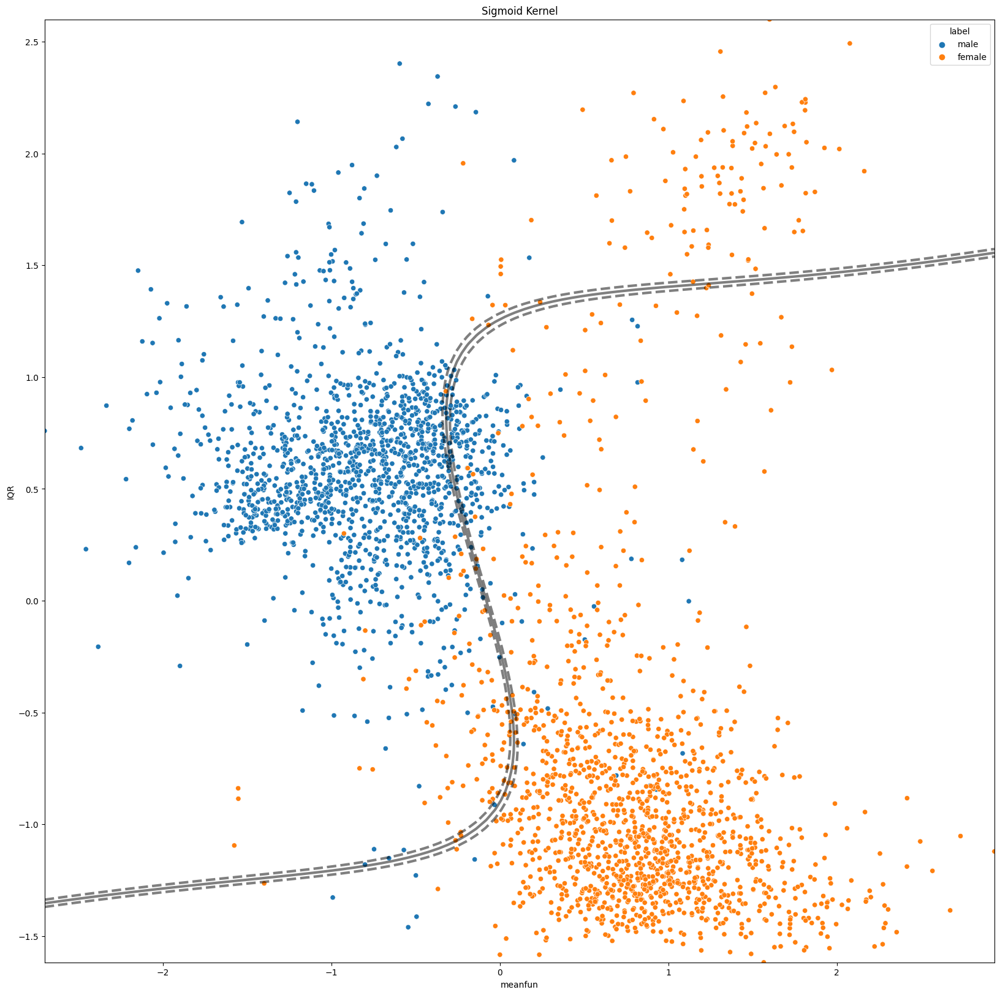

In [91]:
svm_sigmoid = SVC(random_state=87, kernel="sigmoid").fit(X_important, y.squeeze())

scores = cross_val_score(svm_sigmoid, X_important, y.squeeze(), cv=5)
svm_sigmoid_accuracy = scores.mean()

print("Accuracy: {:.4f}".format(svm_sigmoid_accuracy))

draw_svm_plot(svm_sigmoid, X_important, y, "Sigmoid Kernel")

Here are the comparison of the results of the different kernels:

In [92]:
results = pd.DataFrame(
    {
        "Kernel": ["Linear", "Polynomial", "Gaussian", "Sigmoid"],
        "Accuracy": [svm_linear_accuracy, svm_poly_accuracy, svm_gaussian_accuracy, svm_sigmoid_accuracy],
    }
)
results

,Kernel,Accuracy
0,Linear,0.966099
1,Polynomial,0.945824
2,Gaussian,0.968427
3,Sigmoid,0.865405


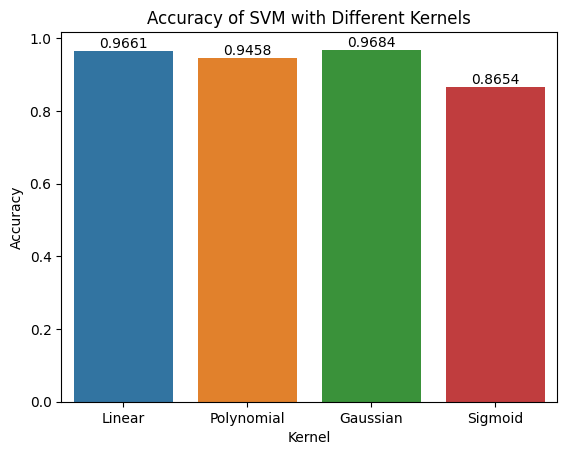

In [93]:
# Create the bar plot with accuracy values as annotations
ax = sns.barplot(data=results, x="Kernel", y="Accuracy")
ax.set_xlabel("Kernel")
ax.set_ylabel("Accuracy")
ax.set_title("Accuracy of SVM with Different Kernels")

# Add accuracy values as annotations to the bar plot
for i in range(len(results)):
    ax.annotate(f"{results['Accuracy'][i]:.4f}", (i, results['Accuracy'][i]), ha='center', va='bottom')

# Show the plot
plt.show()

Put all the graphs together

C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


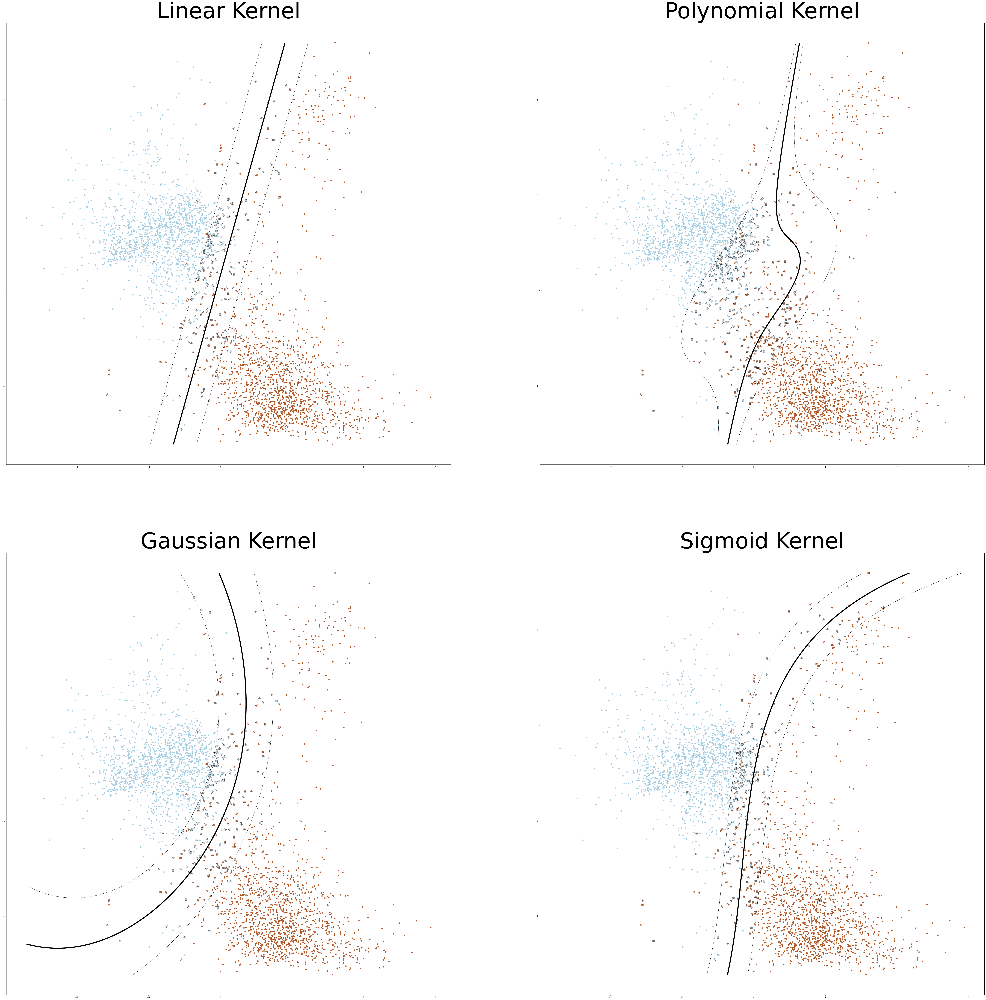

In [131]:
def draw_svm_plot_subplot(svm, X, y, title, axes):
    X = np.array(X)
    y = np.array(y == "female")

    axes.set_title(title)
    axes.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=plt.cm.Paired)
    axes.axis("tight")

    x_min = X[:, 0].min()
    x_max = X[:, 0].max()
    y_min = X[:, 1].min()
    y_max = X[:, 1].max()

    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]
    Z = svm.decision_function(np.c_[XX.ravel(), YY.ravel()]).reshape(XX.shape)

    axes.contour(XX, YY, Z, colors=["k", "k", "k"], linestyles=["--", "-", "--"], levels=[-1, 0, 1], linewidths=[1, 5, 1])
    axes.scatter(svm.support_vectors_[:, 0], svm.support_vectors_[:, 1], s=100, linewidth=0.5, facecolors="none",
                 edgecolors="k")


figure, axes = plt.subplots(2, 2, figsize=(80, 80))
draw_svm_plot_subplot(SVC(random_state=87, kernel="linear").fit(X_important, y.squeeze()), X_important, y.squeeze(), "Linear Kernel", axes[0, 0])
draw_svm_plot_subplot(SVC(random_state=87, kernel="poly", degree=3).fit(X_important, y.squeeze()), X_important, y.squeeze(), "Polynomial Kernel", axes[0, 1])
draw_svm_plot_subplot(SVC(random_state=87, kernel="rbf", gamma=0.1).fit(X_important, y.squeeze()), X_important, y.squeeze(), "Gaussian Kernel", axes[1, 0])
draw_svm_plot_subplot(SVC(random_state=87, kernel="sigmoid", gamma=0.1, coef0=0.1).fit(X_important, y.squeeze()), X_important, y.squeeze(), "Sigmoid Kernel", axes[1, 1])

# make the font size of the title larger
for ax in axes.flat:
    ax.title.set_fontsize(100)

plt.show()

## Exploring the Data with All Features

Average accuracy of the linear SVM model with all features

In [95]:
svm_linear = SVC(random_state=87, kernel="linear")
svm_linear_accuracy = cross_val_score(svm_linear, X, y.squeeze(), cv=5).mean()
print("Linear Accuracy: {:.4f}".format(svm_linear_accuracy))

Linear Accuracy: 0.9681


Average accuracy of the Gaussian SVM model with all features

In [96]:
svm_gaussian = SVC(random_state=87, kernel="rbf")
svm_gaussian_accuracy = cross_val_score(svm_gaussian, X, y.squeeze(), cv=5).mean()
print("Gaussian Accuracy: {:.4f}".format(svm_gaussian_accuracy))

Gaussian Accuracy: 0.9694


Average accuracy of the Polynomial SVM model with all features

In [97]:
svm_poly = SVC(random_state=87, kernel="poly", degree=3)
svm_poly_accuracy = cross_val_score(svm_poly, X, y.squeeze(), cv=5).mean()
print("Polynomial Accuracy: {:.4f}".format(svm_poly_accuracy))

Polynomial Accuracy: 0.9568


Average accuracy of the Sigmoid SVM model with all features

In [98]:
svm_sigmoid = SVC(random_state=87, kernel="sigmoid")
svm_sigmoid_accuracy = cross_val_score(svm_sigmoid, X, y.squeeze(), cv=5).mean()
print("Sigmoid Accuracy: {:.4f}".format(svm_sigmoid_accuracy))

Sigmoid Accuracy: 0.8069


## SVM with $\gamma$ and $C$ Tuning

We try to use the Gaussian kernel with $\gamma$ and $C$ tuning.

### Understanding $\gamma$ and $C$

$\gamma$ and $C$ are parameters of the SVM algorithm. They are used to control the trade-off between the smooth decision boundary and the correct classification of training examples. The $\gamma$ parameter defines how far the influence of a single training example reaches, with low values meaning 'far' and high values meaning 'close'. The $C$ parameter trades off correct classification of training examples against maximization of the decision function's margin. A low $C$ makes the decision surface smooth, while a high $C$ aims at classifying all training examples correctly by giving the model freedom to select more samples as support vectors.

C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\Users\pufan\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


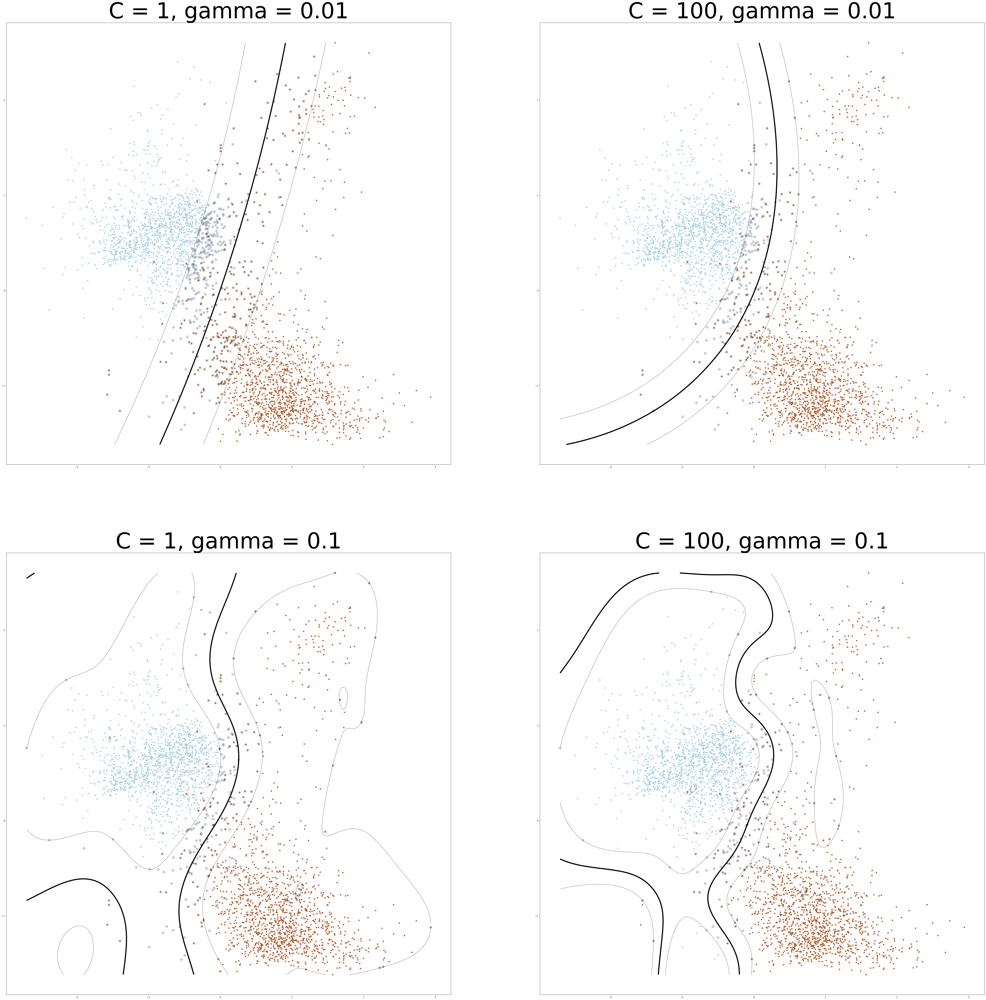

In [132]:
figure, axes = plt.subplots(2, 2, figsize=(80, 80))

draw_svm_plot_subplot(SVC(random_state=87, C=1, gamma=0.01).fit(X_important, y.squeeze()), X_important, y.squeeze(), "C = 1, gamma = 0.01", axes[0, 0])
draw_svm_plot_subplot(SVC(random_state=87, C=100, gamma=0.01).fit(X_important, y.squeeze()), X_important, y.squeeze(), "C = 100, gamma = 0.01", axes[0, 1])
draw_svm_plot_subplot(SVC(random_state=87, C=1, gamma=1).fit(X_important, y.squeeze()), X_important, y.squeeze(), "C = 1, gamma = 0.1", axes[1, 0])
draw_svm_plot_subplot(SVC(random_state=87, C=100, gamma=1).fit(X_important, y.squeeze()), X_important, y.squeeze(), "C = 100, gamma = 0.1", axes[1, 1])


# make the font size of the title larger
for ax in axes.flat:
    ax.title.set_fontsize(100)

plt.show()

This code performs a grid search to find the best hyperparameters for a support vector machine (SVM) model with a Gaussian (RBF) kernel. The hyperparameters being optimized are the regularization parameter C and the kernel coefficient gamma.

The code defines a parameter grid containing a range of values for both hyperparameters to search over. A new SVM model is created with a Gaussian kernel, and the GridSearchCV class is used to perform a 5-fold cross-validated grid search over the parameter grid.

The best hyperparameters and corresponding accuracy are printed to the console, which shows the best combination of C and gamma values that maximizes the accuracy of the SVM model on the training set.

In [113]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import numpy as np

# define parameter ranges to search over
param_grid = {'C': [0.1, 1, 10, 100],
              'gamma': [0.01, 0.1, 1, 10]}

# create SVM model with Gaussian kernel
svm = SVC(kernel='rbf')

# use grid search to find best hyperparameters
grid_search = GridSearchCV(svm, param_grid, cv=5)
grid_search.fit(X, y.squeeze())

# print best hyperparameters and corresponding accuracy
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy: {:.4f}".format(grid_search.best_score_))

Best hyperparameters:  {'C': 10, 'gamma': 0.01}
Best accuracy: 0.9701


In [122]:
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score

# Define the objective function
def objective(X, y, gamma, C):
    clf = SVC(kernel='rbf', gamma=gamma, C=C)
    return cross_val_score(clf, X, y, cv=5).mean()

# Define the hill climbing algorithm
def hill_climbing(X, y, gamma, C, gamma_step=0.0001, C_step=0.001):
    best_score = objective(X, y, gamma, C)
    best_gamma, best_C = gamma, C
    
    for _ in range(10):
        # Perturb gamma and C
        new_gamma = gamma + np.random.uniform(low=-gamma_step, high=gamma_step)
        new_gamma = max(new_gamma, 0.001)
        new_C = C + np.exp(np.random.uniform(low=-C_step, high=C_step))
        
        # Evaluate the new solution
        new_score = objective(X, y, new_gamma, new_C)
        
        # Update the best solution
        if new_score > best_score:
            best_score = new_score
            best_gamma, best_C = new_gamma, new_C

    return best_gamma, best_C, best_score



In [117]:
# Initialize gamma and C using cross-validation
scores = []
for gamma in [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]:
    for C in [0.1, 1, 10, 15, 20]:
        score = cross_val_score(SVC(kernel='rbf', gamma=gamma, C=C), X, y.squeeze(), cv=5).mean()
        scores.append((score, gamma, C))
best_score, gamma, C = max(scores)

print(scores)
print(f"Best score: {best_score:.4f} (gamma={gamma:.2f}, C={C:.2f})")

[(0.9461650294912687, 0.01, 0.1), (0.9687597083487655, 0.01, 1), (0.9700891647917921, 0.01, 10), (0.9694236073874659, 0.01, 15), (0.9684258240695186, 0.01, 20), (0.9564568465624845, 0.1, 0.1), (0.965764147240756, 0.1, 1), (0.9581179761305908, 0.1, 10), (0.9544607271380479, 0.1, 15), (0.9541279484358848, 0.1, 20), (0.9385160944383945, 0.2, 0.1), (0.9611096677188076, 0.2, 1), (0.9534629438201006, 0.2, 10), (0.9537951697337217, 0.2, 15), (0.9537951697337217, 0.2, 20), (0.9149214211087833, 0.3, 0.1), (0.9478156560770807, 0.3, 1), (0.9434934024687536, 0.3, 10), (0.9434934024687536, 0.3, 15), (0.9434934024687536, 0.3, 20), (0.8760250081536309, 0.4, 0.1), (0.9345188804926451, 0.4, 1), (0.9341855490019404, 0.4, 10), (0.9341855490019404, 0.4, 15), (0.9341855490019404, 0.4, 20), (0.8128749979270429, 0.5, 0.1), (0.9202198992819277, 0.5, 1), (0.9208843511091702, 0.5, 10), (0.9208843511091702, 0.5, 15), (0.9208843511091702, 0.5, 20), (0.7567216322740062, 0.6, 0.1), (0.9079175902841886, 0.6, 1), (0.

In [123]:
# Perform hill climbing
for i in range(100):
    gamma, C, score = hill_climbing(X, y.squeeze(), gamma, C, gamma_step=0.01, C_step=10)
    print(f"Iteration {i+1}: gamma={gamma:.4f}, C={C:.2f}, score={score:.4f}")

Iteration 1: gamma=0.0026, C=23.88, score=0.9704
Iteration 2: gamma=0.0026, C=23.88, score=0.9704
Iteration 3: gamma=0.0026, C=23.88, score=0.9704
Iteration 4: gamma=0.0026, C=23.88, score=0.9704
Iteration 5: gamma=0.0026, C=23.88, score=0.9704
Iteration 6: gamma=0.0026, C=23.88, score=0.9704
Iteration 7: gamma=0.0026, C=23.88, score=0.9704
Iteration 8: gamma=0.0026, C=23.88, score=0.9704
Iteration 9: gamma=0.0026, C=23.88, score=0.9704
Iteration 10: gamma=0.0026, C=23.88, score=0.9704
Iteration 11: gamma=0.0026, C=23.88, score=0.9704
Iteration 12: gamma=0.0026, C=23.88, score=0.9704
Iteration 13: gamma=0.0026, C=23.88, score=0.9704
Iteration 14: gamma=0.0026, C=23.88, score=0.9704
Iteration 15: gamma=0.0026, C=23.88, score=0.9704
Iteration 16: gamma=0.0026, C=23.88, score=0.9704
Iteration 17: gamma=0.0026, C=23.88, score=0.9704
Iteration 18: gamma=0.0026, C=23.88, score=0.9704
Iteration 19: gamma=0.0026, C=23.88, score=0.9704
Iteration 20: gamma=0.0026, C=23.88, score=0.9704
Iteration

In [126]:
# Train the final SVM model
clf = SVC(kernel='rbf', gamma=gamma, C=C)
print("gamma: {:.6f}, C: {:.6f}".format(gamma, C))
print("Final accuracy: {:.10f}".format(cross_val_score(clf, X, y.squeeze(), cv=5).mean()))

gamma: 0.002601, C: 23.877762
Final accuracy: 0.9704219435
